In [1]:
import numpy as np
import pandas as pd
import pegasus as pg

In [2]:
sample_dict = {'Sample': ['02-P005175-S053-R01', '02-P118946-S058-R01', '02-P166169-S099-R01', '02-P166169-S099-R02', '02-P166169-S113-R01', '02-P240970-S008-R01', '02-P248880-S086-R01', '02-P334354-S087-R01', '02-P348762-S056-R01','04-P006354-S015-R01', '04-P006354-S057-R01', '04-P006354-S057-R02', '04-P054921-S024-R01', '04-P079042-S015-R01', '04-P103142-S089-R01', '04-P103142-S109-R01', '04-P103142-S148-R01', '04-P103142-S149-R01','04-P103142-S150-R01', '12-P230638-S005-R01', '12-P485759-S008-R01', '12-P617758-S008-R01', '12-P852049-S007-R01', '12-P890292-S007-R01'], 
               'Location': ['covid_lung/02-P005175-S053-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P118946-S058-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P166169-S099-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P166169-S099-R02_out_FPR_0.01_filtered.h5', 'covid_lung/02-P166169-S113-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P240970-S008-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P248880-S086-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P334354-S087-R01_out_FPR_0.01_filtered.h5', 'covid_lung/02-P348762-S056-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P006354-S015-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P006354-S057-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P006354-S057-R02_out_FPR_0.01_filtered.h5', 'covid_lung/04-P054921-S024-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P079042-S015-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P103142-S089-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P103142-S109-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P103142-S148-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P103142-S149-R01_out_FPR_0.01_filtered.h5', 'covid_lung/04-P103142-S150-R01_out_FPR_0.01_filtered.h5', 'covid_lung/12-P230638-S005-R01_out_FPR_0.01_filtered.h5', 'covid_lung/12-P485759-S008-R01_out_FPR_0.01_filtered.h5', 'covid_lung/12-P617758-S008-R01_out_FPR_0.01_filtered.h5', 'covid_lung/12-P852049-S007-R01_out_FPR_0.01_filtered.h5', 'covid_lung/12-P890292-S007-R01_out_FPR_0.01_filtered.h5'],
               'Method': ['nuclei', 'nuclei', 'cryo', 'cryo', 'nuclei', 'nuclei', 'nuclei', 'nuclei', 'nuclei', 'nuclei', 'cryo', 'cryo', 'nuclei', 'nuclei', 'nuclei', 'nuclei', 'fresh', 'fresh', 'fresh', 'nuclei', 'nuclei', 'nuclei', 'nuclei', 'nuclei']
              }

In [3]:
data = pg.aggregate_matrices(sample_dict, attributes = ['Method'], default_ref = 'GRCh38:GRCh38premrna')

2021-01-28 15:29:08,864 - pegasusio.readwrite - INFO - 10x file 'covid_lung/02-P005175-S053-R01_out_FPR_0.01_filtered.h5' is loaded.
2021-01-28 15:29:08,864 - pegasusio.readwrite - INFO - Function 'read_input' finished in 0.34s.
2021-01-28 15:29:09,098 - pegasusio.readwrite - INFO - 10x file 'covid_lung/02-P118946-S058-R01_out_FPR_0.01_filtered.h5' is loaded.
2021-01-28 15:29:09,099 - pegasusio.readwrite - INFO - Function 'read_input' finished in 0.23s.
2021-01-28 15:29:09,152 - pegasusio.multimodal_data - INFO - After filtration, 14107 out of 14107 cell barcodes are kept in UnimodalData object SARSCoV2-rna.
2021-01-28 15:29:09,323 - pegasusio.readwrite - INFO - 10x file 'covid_lung/02-P166169-S099-R01_out_FPR_0.01_filtered.h5' is loaded.
2021-01-28 15:29:09,324 - pegasusio.readwrite - INFO - Function 'read_input' finished in 0.15s.
2021-01-28 15:29:09,375 - pegasusio.multimodal_data - INFO - After filtration, 3307 out of 3307 cell barcodes are kept in UnimodalData object SARSCoV2-rna.

2021-01-28 15:29:18,237 - pegasusio.data_aggregation - INFO - Aggregated 24 files.
2021-01-28 15:29:18,240 - pegasusio.data_aggregation - INFO - Function 'aggregate_matrices' finished in 9.72s.


In [4]:
pg.qc_metrics(data, min_genes = 200, max_genes = 6000, min_umis = 400, max_umis = 600000, mito_prefix = 'MT-', percent_mito = 20)
pg.filter_data(data)
pg.identify_robust_genes(data)
pg.log_norm(data)
pg.highly_variable_features(data, consider_batch=True)
pg.pca(data, robust=True)
pca_key = pg.run_harmony(data)
pg.neighbors(data, rep=pca_key)
pg.louvain(data, rep=pca_key)
pg.umap(data, rep=pca_key)

2021-01-28 15:30:12,968 - pegasusio.qc_utils - INFO - After filtration, 106792 out of 182811 cell barcodes are kept in UnimodalData object GRCh38premrna-rna.
2021-01-28 15:30:13,074 - pegasusio.multimodal_data - INFO - After filtration, 106792 out of 182811 cell barcodes are kept in UnimodalData object SARSCoV2-rna.
2021-01-28 15:30:13,075 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.75s.
2021-01-28 15:30:15,253 - pegasus.tools.preprocessing - INFO - After filtration, 30955/33538 genes are kept. Among 30955 genes, 23216 genes are robust.
2021-01-28 15:30:15,254 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 2.18s.
2021-01-28 15:30:17,077 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 1.82s.
2021-01-28 15:30:17,869 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.79s.
2021-01-28 15:30:17,914 - pegasus.tools.hvf_selection - INFO - 2000 highly variable fea

/Users/bl621/Documents/software/miniconda3/envs/pegasus/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).
2021-01-28 15:32:30,058 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 116.42s.
2021-01-28 15:32:53,271 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 23.21s.
2021-01-28 15:32:57,254 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 3.98s.
2021-01-28 15:33:01,856 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 4.59s.
2021-01-28 15:34:41,831 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 25 clusters.
2021-01-28 15:34:42,201 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 104.94s.
2021-01-28 15:34:42,201 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2021-01-28 15:34:42

2021-01-28 15:35:54,854 - pegasus.tools.preprocessing - INFO - After filtration, 25205/30955 genes are kept. Among 25205 genes, 20462 genes are robust.
2021-01-28 15:35:54,854 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.21s.
2021-01-28 15:35:54,968 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.11s.
2021-01-28 15:35:54,993 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.02s.
2021-01-28 15:35:55,026 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:35:55,026 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.06s.
2021-01-28 15:35:58,854 - pegasus.tools.doublet_detection - INFO - Sample 02-P005175-S053-R01: doublet threshold = 0.1622; total cells = 8292; neotypic doublet rate = 5.29%
2021-01-28 15:35:59,294 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.

2021-01-28 15:36:19,254 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.13s.
2021-01-28 15:36:19,289 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.03s.
2021-01-28 15:36:19,327 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:36:19,327 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.07s.
2021-01-28 15:36:23,620 - pegasus.tools.doublet_detection - INFO - Sample 02-P348762-S056-R01: doublet threshold = 0.1698; total cells = 9880; neotypic doublet rate = 7.06%
2021-01-28 15:36:23,937 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.61s.
2021-01-28 15:36:24,933 - pegasus.tools.preprocessing - INFO - After filtration, 22428/30955 genes are kept. Among 22428 genes, 22428 genes are robust.
2021-01-28 15:36:24,933 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.

2021-01-28 15:36:45,418 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:36:45,419 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.05s.
2021-01-28 15:36:45,569 - pegasus.tools.doublet_detection - INFO - Sample 04-P103142-S148-R01: doublet threshold = 0.0025; total cells = 193; neotypic doublet rate = 12.44%
2021-01-28 15:36:45,897 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 0.48s.
2021-01-28 15:36:46,924 - pegasus.tools.preprocessing - INFO - After filtration, 18986/30955 genes are kept. Among 18986 genes, 18986 genes are robust.
2021-01-28 15:36:46,925 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.23s.
2021-01-28 15:36:46,954 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.03s.
2021-01-28 15:36:46,963 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.

/Users/bl621/Documents/software/pegasus/pegasus/tools/doublet_detection.py:167: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, 2, figsize = fig_size, dpi = dpi)


2021-01-28 15:37:02,968 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.63s.
2021-01-28 15:37:04,332 - pegasus.tools.preprocessing - INFO - After filtration, 24671/30955 genes are kept. Among 24671 genes, 20999 genes are robust.
2021-01-28 15:37:04,332 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.50s.
2021-01-28 15:37:04,448 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.11s.
2021-01-28 15:37:04,473 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.02s.
2021-01-28 15:37:04,516 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:37:04,516 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.07s.
2021-01-28 15:37:08,246 - pegasus.tools.doublet_detection - INFO - Sample 12-P617758-S008-R01: doublet threshold = 0.1695; total cells = 7700; neotypic doublet rate = 5

/Users/bl621/Documents/software/pegasus/pegasus/tools/doublet_detection.py:167: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, 2, figsize = fig_size, dpi = dpi)


2021-01-28 15:37:08,625 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.11s.
2021-01-28 15:37:10,070 - pegasus.tools.preprocessing - INFO - After filtration, 26337/30955 genes are kept. Among 26337 genes, 23037 genes are robust.
2021-01-28 15:37:10,071 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.52s.
2021-01-28 15:37:10,253 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.18s.
2021-01-28 15:37:10,293 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.04s.
2021-01-28 15:37:10,348 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:37:10,349 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.10s.
2021-01-28 15:37:14,144 - pegasus.tools.doublet_detection - INFO - Sample 12-P852049-S007-R01: doublet threshold = 0.1469; total cells = 7582; neotypic doublet rate = 5

/Users/bl621/Documents/software/pegasus/pegasus/tools/doublet_detection.py:167: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, 2, figsize = fig_size, dpi = dpi)


2021-01-28 15:37:14,550 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.20s.
2021-01-28 15:37:16,017 - pegasus.tools.preprocessing - INFO - After filtration, 26185/30955 genes are kept. Among 26185 genes, 22245 genes are robust.
2021-01-28 15:37:16,018 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.53s.
2021-01-28 15:37:16,212 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.19s.
2021-01-28 15:37:16,252 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.04s.
2021-01-28 15:37:16,308 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-01-28 15:37:16,309 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.10s.
2021-01-28 15:37:20,224 - pegasus.tools.doublet_detection - INFO - Sample 12-P890292-S007-R01: doublet threshold = 0.1294; total cells = 8259; neotypic doublet rate = 7

/Users/bl621/Documents/software/pegasus/pegasus/tools/doublet_detection.py:167: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, 2, figsize = fig_size, dpi = dpi)


2021-01-28 15:37:20,622 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 4.31s.
2021-01-28 15:37:21,562 - pegasus.tools.doublet_detection - INFO - Doublets are predicted!
2021-01-28 15:37:21,562 - pegasus.tools.doublet_detection - INFO - Function 'infer_doublets' finished in 87.08s.


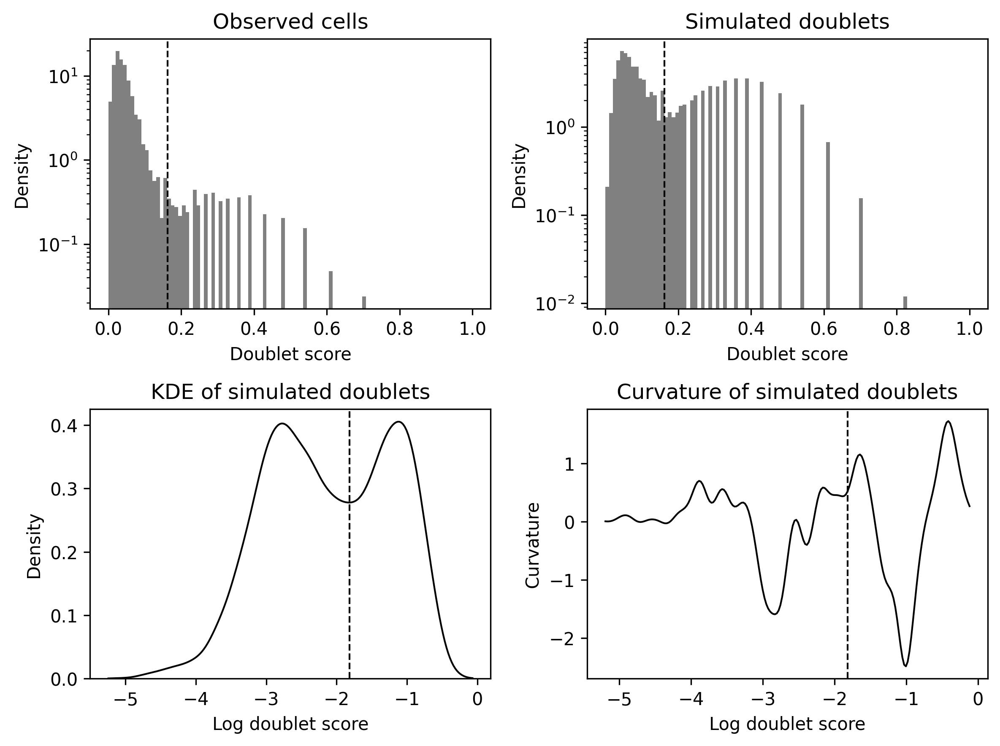

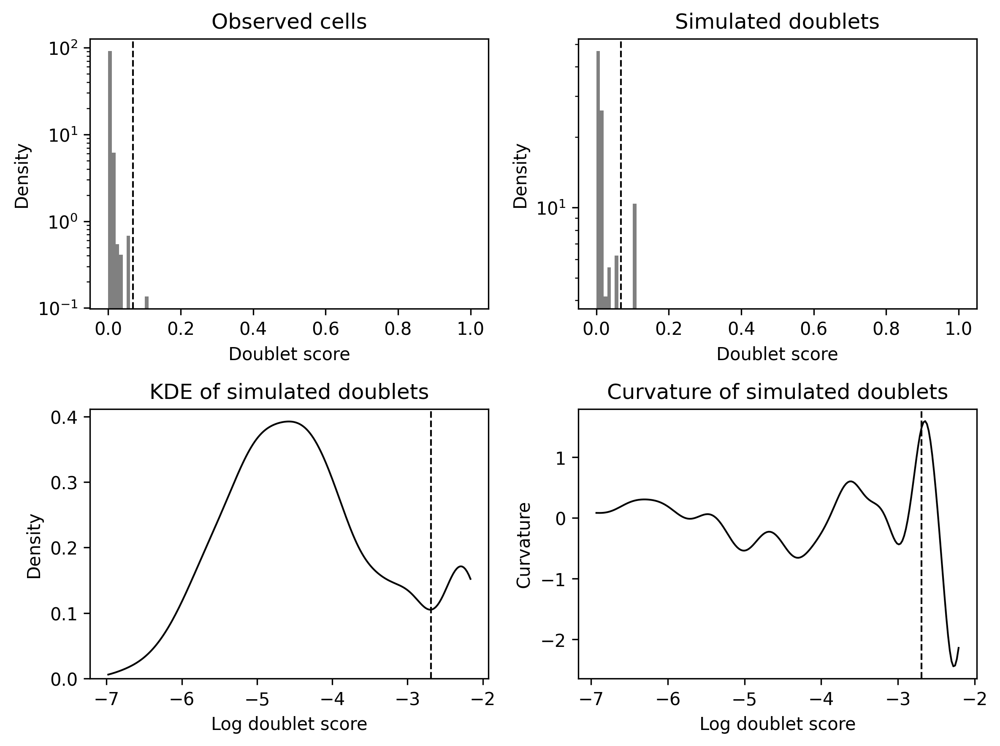

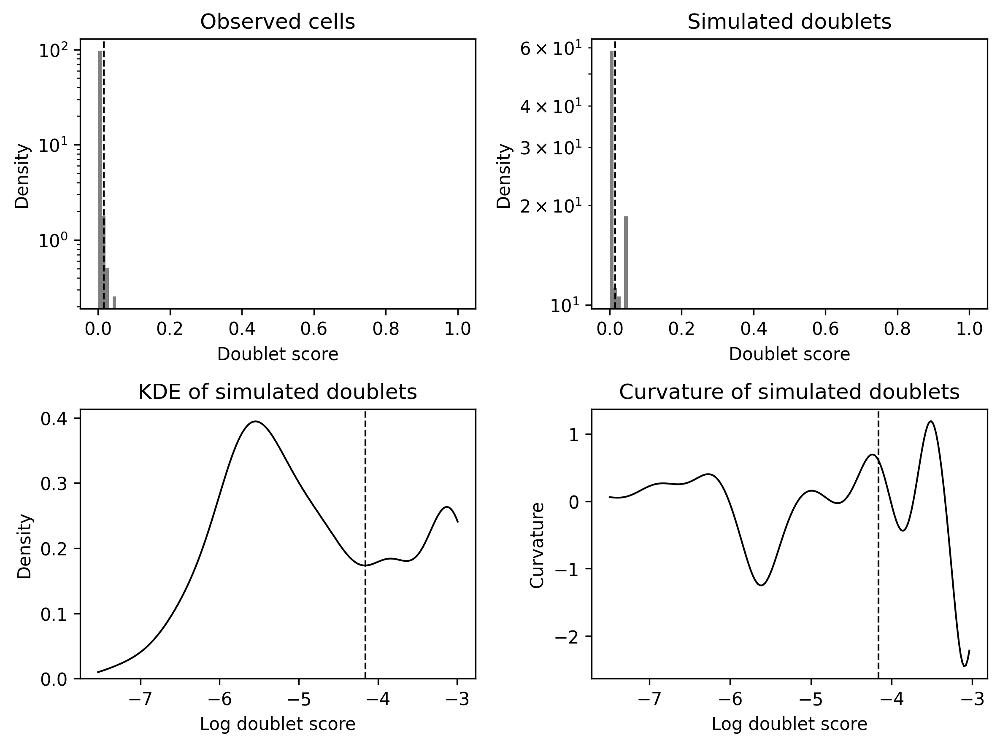

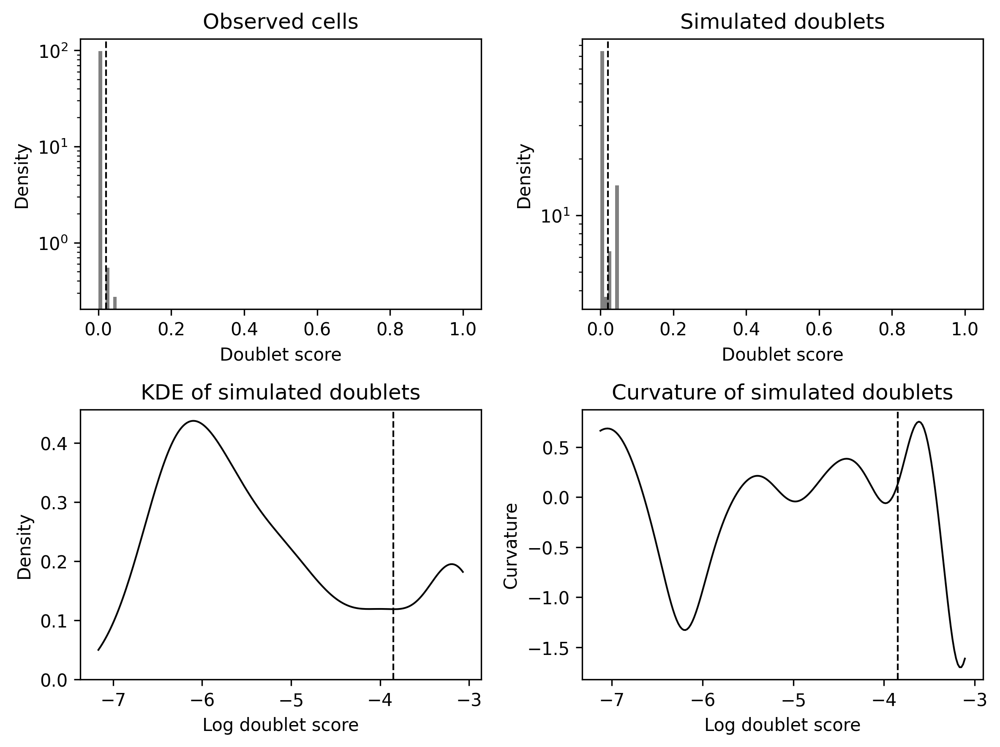

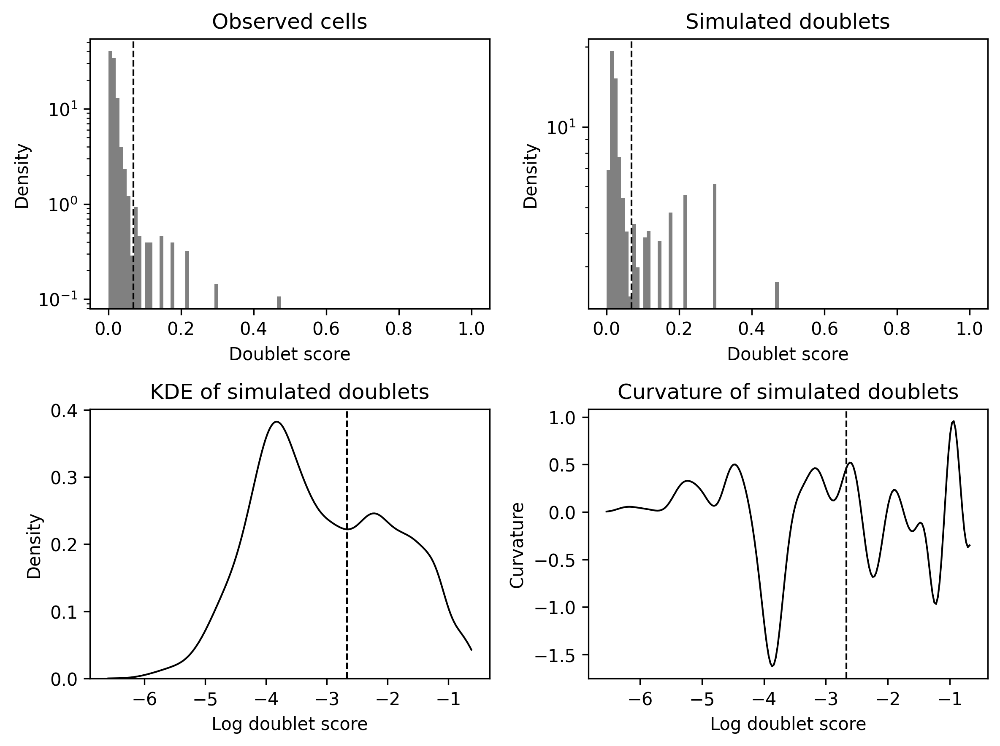

...

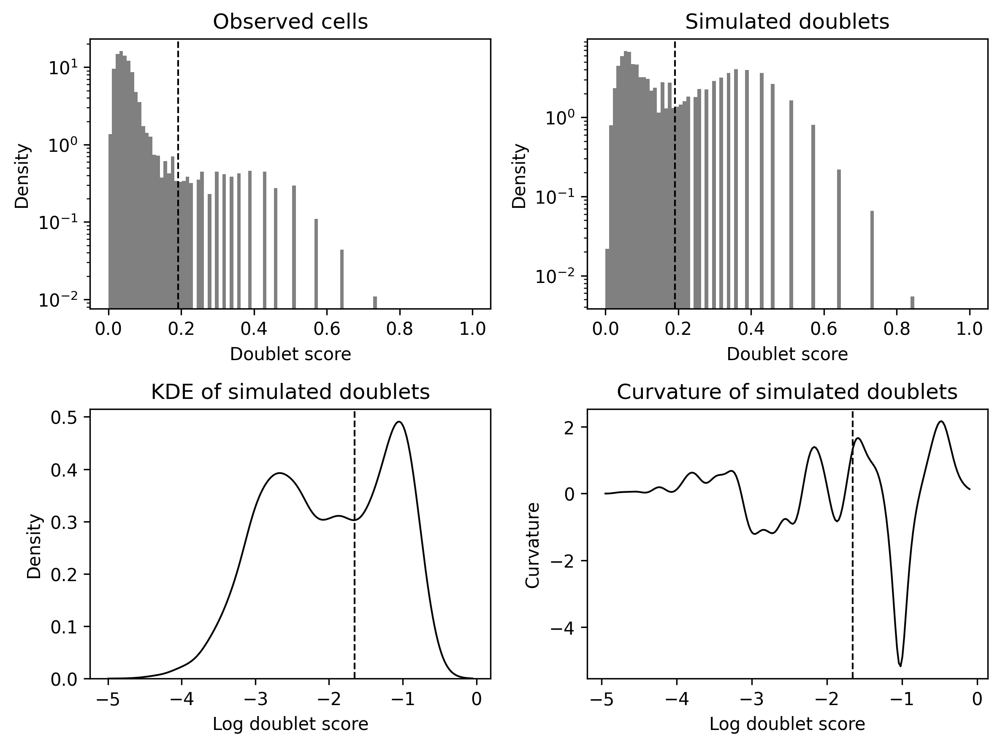

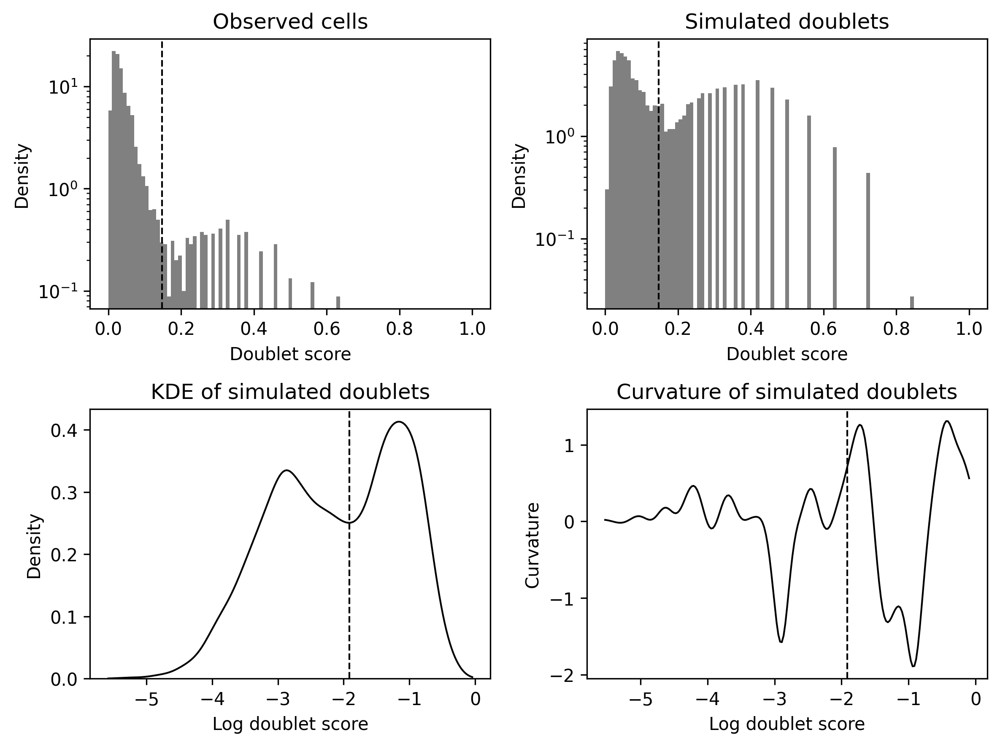

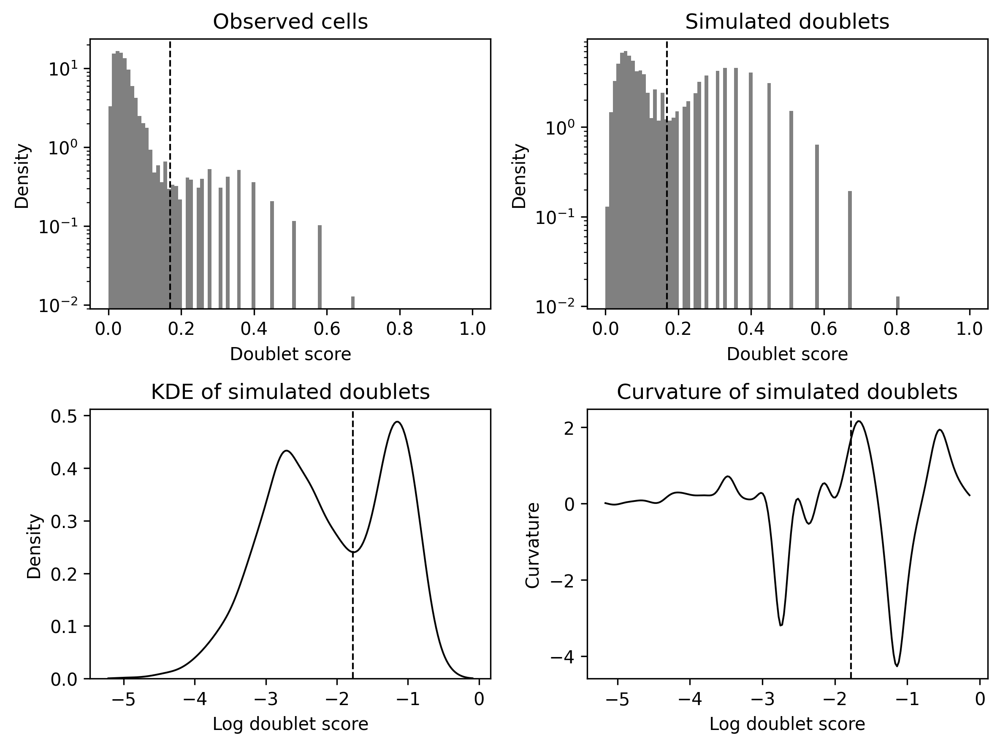

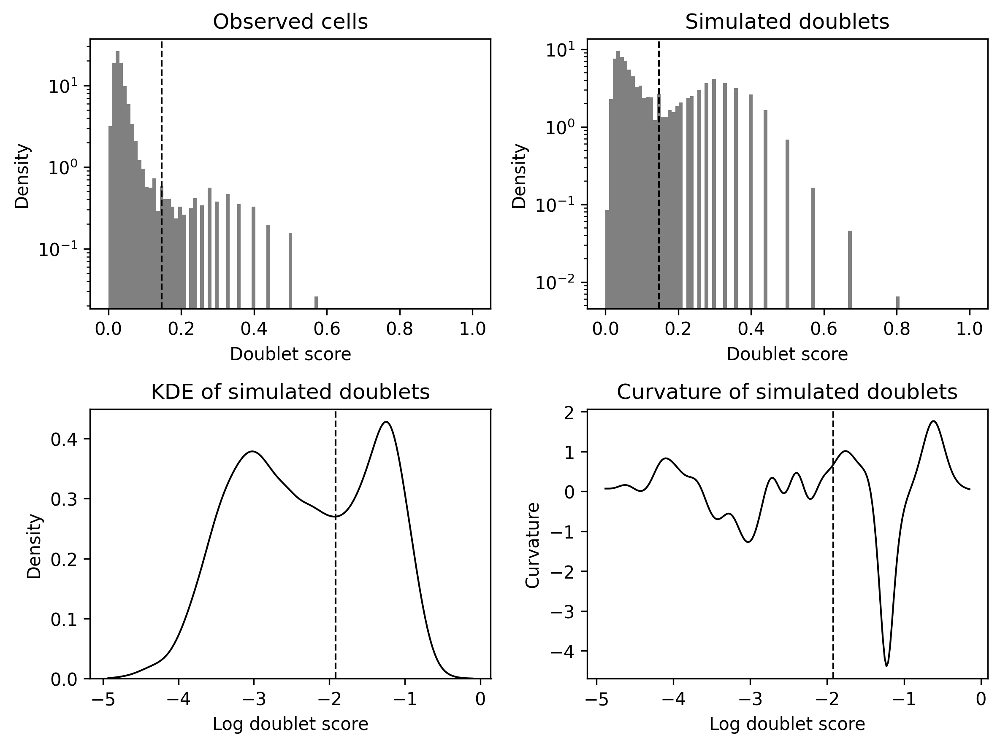

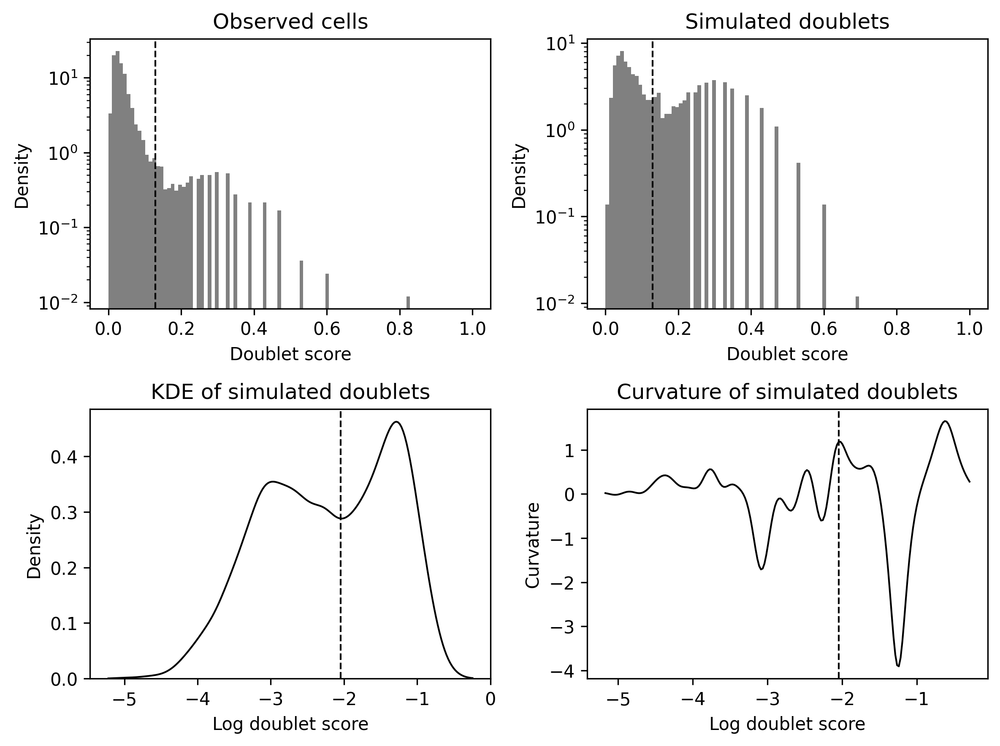

In [5]:
pg.infer_doublets(data, channel_attr = 'Channel', clust_attr = 'louvain_labels', robust = True)

In [6]:
data.uns['pred_dbl_cluster']

,cluster,percentage,pval,qval
0,21,75.523013,0.000001,0.000016
1,19,74.057038,0.000003,0.000016
2,17,70.424597,0.000003,0.000016
3,13,15.519509,0.000004,0.000016
4,22,12.268519,0.000002,0.000016
5,23,10.507246,0.000725,0.000954
6,10,7.054795,0.000009,0.000016
7,7,6.708567,0.000009,0.000016


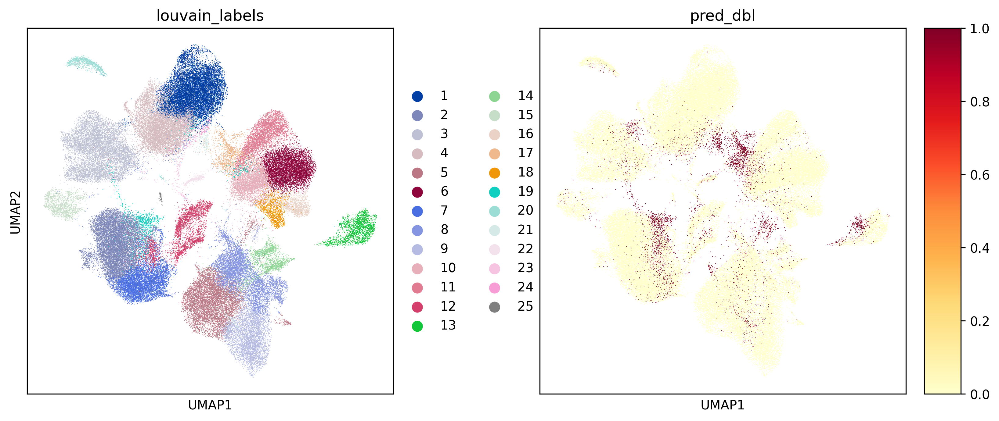

In [7]:
pg.scatter(data, attrs = ['louvain_labels', 'pred_dbl'])

#### 

In [8]:
data.obs['Channel'].value_counts(sort = False)

02-P005175-S053-R01    8292
02-P118946-S058-R01     725
02-P166169-S099-R01     387
02-P166169-S099-R02     361
02-P166169-S113-R01    2770
02-P240970-S008-R01    3339
02-P248880-S086-R01    9555
02-P334354-S087-R01    4679
02-P348762-S056-R01    9880
04-P006354-S015-R01    1992
04-P006354-S057-R01     736
04-P006354-S057-R02    3124
04-P054921-S024-R01    3179
04-P079042-S015-R01    2716
04-P103142-S089-R01    5240
04-P103142-S109-R01    5835
04-P103142-S148-R01     193
04-P103142-S149-R01    1786
04-P103142-S150-R01     470
12-P230638-S005-R01    9027
12-P485759-S008-R01    8965
12-P617758-S008-R01    7700
12-P852049-S007-R01    7582
12-P890292-S007-R01    8259
Name: Channel, dtype: int64

In [10]:
pg.mark_doublets(data, dbl_clusts = 'louvain_labels:17,19,21')

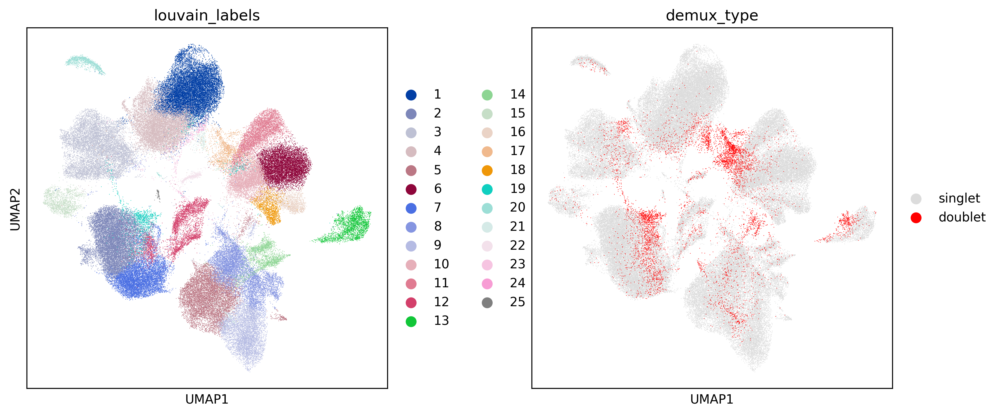

In [11]:
pg.scatter(data, attrs = ['louvain_labels', 'demux_type'], palettes = 'demux_type:gainsboro,red')

In [12]:
res = data.obs['demux_type'].value_counts()
print(res)
print(res['doublet']/res.sum())

singlet    100196
doublet      6596
Name: demux_type, dtype: int64
0.06176492621170125


In [15]:
idx = data.obs['demux_type'] == 'doublet'
with open('lung_doublets.txt', 'w') as fout:
    fout.write('\n'.join(data.obs_names[idx]) + '\n')